In [1]:
import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import torch.distributions
from torchvision import datasets, models, transforms
import numpy as np
import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200
from torch.distributions.multivariate_normal import MultivariateNormal
from torchvision.transforms import Compose, ToTensor, Lambda, ToPILImage, CenterCrop, Resize
import os
from PIL import Image
import torchvision
from tqdm.auto import tqdm
from torch.optim import Adam,AdamW
plt.rcParams['figure.figsize'] = [3, 3]

In [2]:
# Set the seed for PyTorch
seed = 42
torch.manual_seed(seed)

# If you are using CUDA (GPU), set the seed for CUDA as well
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

# Additional steps for ensuring reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [3]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cuda:0'

In [4]:
batch_size = 16
image_size = 128

In [5]:


# Add the custom transform to the data transforms
transform = transforms.Compose([
                    transforms.Resize((128, 128)),
                    transforms.ToTensor(),
                    Lambda(lambda t: (t * 2) - 1), 
                     ])

reverse_transform = transforms.Compose([
     Lambda(lambda t: (t + 1) / 2),
     Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
     Lambda(lambda t: t * 255.),
     Lambda(lambda t: t.numpy().astype(np.uint8)),
     ToPILImage(),
])
# Create train, test, and validation datasets
train_data = datasets.ImageFolder('../afhq/train/', transform)


In [6]:
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,
                                             shuffle=True, num_workers=4)
class_names = train_data.classes

print("Train dataset size --- ",len(train_data))
print("Class_names --- ",class_names)

Train dataset size ---  14630
Class_names ---  ['cat', 'dog', 'wild']


In [7]:
train_iter = iter(train_loader)
X,Y = next(train_iter)
print(X.shape)
print(Y.shape)

torch.Size([16, 3, 128, 128])
torch.Size([16])


In [8]:
print(X.max())
print(X.min())

tensor(1.)
tensor(-1.)


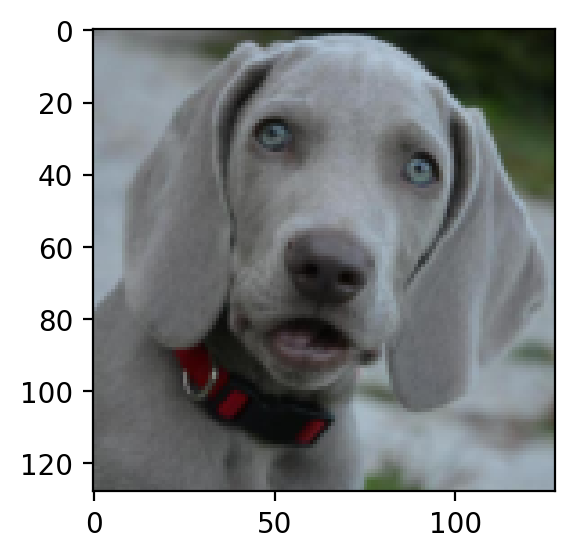

In [9]:
img = reverse_transform(X[0])
plt.imshow(img)

In [10]:
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)

def linear_beta_schedule(timesteps):
    scale = 1000 / timesteps
    beta_start = scale * 0.0001
    beta_end = scale * 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return torch.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    betas = torch.linspace(-6, 6, timesteps)
    return torch.sigmoid(betas) * (beta_end - beta_start) + beta_start

In [11]:
timesteps = 4000

# define beta schedule
betas = linear_beta_schedule(timesteps=timesteps)

# define alphas 
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)

# calculations for diffusion q(x_t | x_{t-1}) and others
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

# calculations for posterior q(x_{t-1} | x_t, x_0)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

In [12]:
# forward diffusion
def q_sample(x_start, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_start)

    sqrt_alphas_cumprod_t = extract(sqrt_alphas_cumprod, t, x_start.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x_start.shape
    )

    return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

In [13]:
def get_noisy_image(x_start, t):
  # add noise
  x_noisy = q_sample(x_start, t=t)

  # turn back into PIL image
  noisy_image = reverse_transform(x_noisy.squeeze())

  return noisy_image

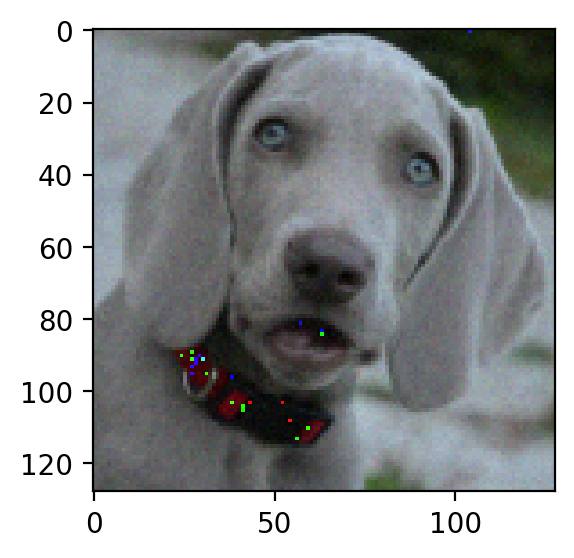

In [14]:
plt.imshow(get_noisy_image(X[0],torch.tensor([30])))

In [15]:
import matplotlib.pyplot as plt

# use seed for reproducability
torch.manual_seed(0)

# source: https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py
def plot(imgs, with_orig=False, row_title=None, **imshow_kwargs):
    if not isinstance(imgs[0], list):
        # Make a 2d grid even if there's just 1 row
        imgs = [imgs]

    num_rows = len(imgs)
    num_cols = len(imgs[0]) + with_orig
    fig, axs = plt.subplots(figsize=(200,200), nrows=num_rows, ncols=num_cols, squeeze=False)
    for row_idx, row in enumerate(imgs):
        # row = [image] + row if with_orig else row
        for col_idx, img in enumerate(row):
            ax = axs[row_idx, col_idx]
            ax.imshow(np.asarray(img), **imshow_kwargs)
            ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    if with_orig:
        axs[0, 0].set(title='Original image')
        axs[0, 0].title.set_size(8)
    if row_title is not None:
        for row_idx in range(num_rows):
            axs[row_idx, 0].set(ylabel=row_title[row_idx])

    plt.tight_layout()

In [17]:
forward_proccess = [get_noisy_image(X[0], torch.tensor([t])) for t in [0, 50, 100, 150, 199]]
plot(forward_proccess)

In [16]:
def p_losses(denoise_model, x_start, t, noise=None, loss_type="l1"):
    if noise is None:
        noise = torch.randn_like(x_start)

    x_noisy = q_sample(x_start=x_start, t=t, noise=noise)
    predicted_noise = denoise_model(x_noisy, t)

    if loss_type == 'l1':
        loss = F.l1_loss(noise, predicted_noise)
    elif loss_type == 'l2':
        loss = F.mse_loss(noise, predicted_noise)
    elif loss_type == "huber":
        loss = F.smooth_l1_loss(noise, predicted_noise)
    else:
        raise NotImplementedError()

    return loss

In [17]:
@torch.no_grad()
def p_sample(model, x, t, t_index):
    betas_t = extract(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = extract(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = extract(sqrt_recip_alphas, t, x.shape)
    
    # Equation 11 in the paper
    # Use our model (noise predictor) to predict the mean
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )

    if t_index == 0:
        return model_mean
    else:
        posterior_variance_t = extract(posterior_variance, t, x.shape)
        noise = torch.randn_like(x)
        # Algorithm 2 line 4:
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

# Algorithm 2 but save all images:
@torch.no_grad()
def p_sample_loop(model, shape):
    device = next(model.parameters()).device

    b = shape[0]
    # start from pure noise (for each example in the batch)
    img = torch.randn(shape, device=device)
    imgs = []
    
    save_every = 400
    for i in tqdm(reversed(range(0, timesteps)), desc='sampling loop time step', total=timesteps):
        img = p_sample(model, img, torch.full((b,), i, device=device, dtype=torch.long), i)
        # if i % save_every == 0:
        #     imgs.append(img.cpu())
        imgs.append(img.cpu())
    return imgs

@torch.no_grad()
def sample(model, image_size, batch_size=16, channels=3):
    return p_sample_loop(model, shape=(batch_size, channels, image_size, image_size))

### U-Net


In [18]:
"""
Various utilities for neural networks.
"""

import math

import torch as th
import torch.nn as nn
import torch.nn.functional as F


class GroupNorm32(nn.GroupNorm):
    def __init__(self, num_groups, num_channels, swish, eps=1e-5):
        super().__init__(num_groups=num_groups, num_channels=num_channels, eps=eps)
        self.swish = swish

    def forward(self, x):
        y = super().forward(x.float()).to(x.dtype)
        if self.swish == 1.0:
            y = F.silu(y)
        elif self.swish:
            y = y * F.sigmoid(y * float(self.swish))
        return y


def conv_nd(dims, *args, **kwargs):
    """
    Create a 1D, 2D, or 3D convolution module.
    """
    if dims == 1:
        return nn.Conv1d(*args, **kwargs)
    elif dims == 2:
        return nn.Conv2d(*args, **kwargs)
    elif dims == 3:
        return nn.Conv3d(*args, **kwargs)
    raise ValueError(f"unsupported dimensions: {dims}")


def linear(*args, **kwargs):
    """
    Create a linear module.
    """
    return nn.Linear(*args, **kwargs)


def avg_pool_nd(dims, *args, **kwargs):
    """
    Create a 1D, 2D, or 3D average pooling module.
    """
    if dims == 1:
        return nn.AvgPool1d(*args, **kwargs)
    elif dims == 2:
        return nn.AvgPool2d(*args, **kwargs)
    elif dims == 3:
        return nn.AvgPool3d(*args, **kwargs)
    raise ValueError(f"unsupported dimensions: {dims}")


def zero_module(module):
    """
    Zero out the parameters of a module and return it.
    """
    for p in module.parameters():
        p.detach().zero_()
    return module


def scale_module(module, scale):
    """
    Scale the parameters of a module and return it.
    """
    for p in module.parameters():
        p.detach().mul_(scale)
    return module


def normalization(channels, swish=0.0):
    """
    Make a standard normalization layer, with an optional swish activation.

    :param channels: number of input channels.
    :return: an nn.Module for normalization.
    """
    return GroupNorm32(num_channels=channels, num_groups=32, swish=swish)


def timestep_embedding(timesteps, dim, max_period=10000):
    """
    Create sinusoidal timestep embeddings.

    :param timesteps: a 1-D Tensor of N indices, one per batch element.
                      These may be fractional.
    :param dim: the dimension of the output.
    :param max_period: controls the minimum frequency of the embeddings.
    :return: an [N x dim] Tensor of positional embeddings.
    """
    half = dim // 2
    freqs = th.exp(
        -math.log(max_period) * th.arange(start=0, end=half, dtype=th.float32) / half
    ).to(device=timesteps.device)
    args = timesteps[:, None].float() * freqs[None]
    embedding = th.cat([th.cos(args), th.sin(args)], dim=-1)
    if dim % 2:
        embedding = th.cat([embedding, th.zeros_like(embedding[:, :1])], dim=-1)
    return embedding

In [19]:
import math
from abc import abstractmethod

import torch as th
import torch.nn as nn
import torch.nn.functional as F


class TimestepBlock(nn.Module):
    """
    Any module where forward() takes timestep embeddings as a second argument.
    """

    @abstractmethod
    def forward(self, x, emb):
        """
        Apply the module to `x` given `emb` timestep embeddings.
        """


class TimestepEmbedSequential(nn.Sequential, TimestepBlock):
    """
    A sequential module that passes timestep embeddings to the children that
    support it as an extra input.
    """

    def forward(self, x, emb, encoder_out=None):
        for layer in self:
            if isinstance(layer, TimestepBlock):
                x = layer(x, emb)
            elif isinstance(layer, AttentionBlock):
                x = layer(x, encoder_out)
            else:
                x = layer(x)
        return x


class Upsample(nn.Module):
    """
    An upsampling layer with an optional convolution.

    :param channels: channels in the inputs and outputs.
    :param use_conv: a bool determining if a convolution is applied.
    :param dims: determines if the signal is 1D, 2D, or 3D. If 3D, then
                 upsampling occurs in the inner-two dimensions.
    """

    def __init__(self, channels, use_conv, dims=2, out_channels=None):
        super().__init__()
        self.channels = channels
        self.out_channels = out_channels or channels
        self.use_conv = use_conv
        self.dims = dims
        if use_conv:
            self.conv = conv_nd(dims, self.channels, self.out_channels, 3, padding=1)

    def forward(self, x):
        assert x.shape[1] == self.channels
        if self.dims == 3:
            x = F.interpolate(x, (x.shape[2], x.shape[3] * 2, x.shape[4] * 2), mode="nearest")
        else:
            x = F.interpolate(x, scale_factor=2, mode="nearest")
        if self.use_conv:
            x = self.conv(x)
        return x


class Downsample(nn.Module):
    """
    A downsampling layer with an optional convolution.

    :param channels: channels in the inputs and outputs.
    :param use_conv: a bool determining if a convolution is applied.
    :param dims: determines if the signal is 1D, 2D, or 3D. If 3D, then
                 downsampling occurs in the inner-two dimensions.
    """

    def __init__(self, channels, use_conv, dims=2, out_channels=None):
        super().__init__()
        self.channels = channels
        self.out_channels = out_channels or channels
        self.use_conv = use_conv
        self.dims = dims
        stride = 2 if dims != 3 else (1, 2, 2)
        if use_conv:
            self.op = conv_nd(dims, self.channels, self.out_channels, 3, stride=stride, padding=1)
        else:
            assert self.channels == self.out_channels
            self.op = avg_pool_nd(dims, kernel_size=stride, stride=stride)

    def forward(self, x):
        assert x.shape[1] == self.channels
        return self.op(x)


class ResBlock(TimestepBlock):
    """
    A residual block that can optionally change the number of channels.

    :param channels: the number of input channels.
    :param emb_channels: the number of timestep embedding channels.
    :param dropout: the rate of dropout.
    :param out_channels: if specified, the number of out channels.
    :param use_conv: if True and out_channels is specified, use a spatial
        convolution instead of a smaller 1x1 convolution to change the
        channels in the skip connection.
    :param dims: determines if the signal is 1D, 2D, or 3D.
    :param use_checkpoint: if True, use gradient checkpointing on this module.
    :param up: if True, use this block for upsampling.
    :param down: if True, use this block for downsampling.
    """

    def __init__(
        self,
        channels,
        emb_channels,
        dropout,
        out_channels=None,
        use_conv=False,
        use_scale_shift_norm=False,
        dims=2,
        use_checkpoint=False,
        up=False,
        down=False,
    ):
        super().__init__()
        self.channels = channels
        self.emb_channels = emb_channels
        self.dropout = dropout
        self.out_channels = out_channels or channels
        self.use_conv = use_conv
        self.use_checkpoint = use_checkpoint
        self.use_scale_shift_norm = use_scale_shift_norm

        self.in_layers = nn.Sequential(
            normalization(channels, swish=1.0),
            nn.Identity(),
            conv_nd(dims, channels, self.out_channels, 3, padding=1),
        )

        self.updown = up or down

        if up:
            self.h_upd = Upsample(channels, False, dims)
            self.x_upd = Upsample(channels, False, dims)
        elif down:
            self.h_upd = Downsample(channels, False, dims)
            self.x_upd = Downsample(channels, False, dims)
        else:
            self.h_upd = self.x_upd = nn.Identity()

        self.emb_layers = nn.Sequential(
            nn.SiLU(),
            linear(
                emb_channels,
                2 * self.out_channels if use_scale_shift_norm else self.out_channels,
            ),
        )
        self.out_layers = nn.Sequential(
            normalization(self.out_channels, swish=0.0 if use_scale_shift_norm else 1.0),
            nn.SiLU() if use_scale_shift_norm else nn.Identity(),
            nn.Dropout(p=dropout),
            zero_module(conv_nd(dims, self.out_channels, self.out_channels, 3, padding=1)),
        )

        if self.out_channels == channels:
            self.skip_connection = nn.Identity()
        elif use_conv:
            self.skip_connection = conv_nd(dims, channels, self.out_channels, 3, padding=1)
        else:
            self.skip_connection = conv_nd(dims, channels, self.out_channels, 1)

    def forward(self, x, emb):
        """
        Apply the block to a Tensor, conditioned on a timestep embedding.

        :param x: an [N x C x ...] Tensor of features.
        :param emb: an [N x emb_channels] Tensor of timestep embeddings.
        :return: an [N x C x ...] Tensor of outputs.
        """
        if self.updown:
            in_rest, in_conv = self.in_layers[:-1], self.in_layers[-1]
            h = in_rest(x)
            h = self.h_upd(h)
            x = self.x_upd(x)
            h = in_conv(h)
        else:
            h = self.in_layers(x)
        emb_out = self.emb_layers(emb).type(h.dtype)
        while len(emb_out.shape) < len(h.shape):
            emb_out = emb_out[..., None]
        if self.use_scale_shift_norm:
            out_norm, out_rest = self.out_layers[0], self.out_layers[1:]
            scale, shift = th.chunk(emb_out, 2, dim=1)
            h = out_norm(h) * (1 + scale) + shift
            h = out_rest(h)
        else:
            h = h + emb_out
            h = self.out_layers(h)
        return self.skip_connection(x) + h


class AttentionBlock(nn.Module):
    """
    An attention block that allows spatial positions to attend to each other.

    Originally ported from here, but adapted to the N-d case.
    https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/models/unet.py#L66.
    """

    def __init__(
        self,
        channels,
        num_heads=1,
        num_head_channels=-1,
        use_checkpoint=False,
        encoder_channels=None,
    ):
        super().__init__()
        self.channels = channels
        if num_head_channels == -1:
            self.num_heads = num_heads
        else:
            assert (
                channels % num_head_channels == 0
            ), f"q,k,v channels {channels} is not divisible by num_head_channels {num_head_channels}"
            self.num_heads = channels // num_head_channels
        self.use_checkpoint = use_checkpoint
        self.norm = normalization(channels, swish=0.0)
        self.qkv = conv_nd(1, channels, channels * 3, 1)
        self.attention = QKVAttention(self.num_heads)

        if encoder_channels is not None:
            self.encoder_kv = conv_nd(1, encoder_channels, channels * 2, 1)
        self.proj_out = zero_module(conv_nd(1, channels, channels, 1))

    def forward(self, x, encoder_out=None):
        b, c, *spatial = x.shape
        qkv = self.qkv(self.norm(x).view(b, c, -1))
        if encoder_out is not None:
            encoder_out = self.encoder_kv(encoder_out)
            h = self.attention(qkv, encoder_out)
        else:
            h = self.attention(qkv)
        h = self.proj_out(h)
        return x + h.reshape(b, c, *spatial)


class QKVAttention(nn.Module):
    """
    A module which performs QKV attention. Matches legacy QKVAttention + input/ouput heads shaping
    """

    def __init__(self, n_heads):
        super().__init__()
        self.n_heads = n_heads

    def forward(self, qkv, encoder_kv=None):
        """
        Apply QKV attention.

        :param qkv: an [N x (H * 3 * C) x T] tensor of Qs, Ks, and Vs.
        :return: an [N x (H * C) x T] tensor after attention.
        """
        bs, width, length = qkv.shape
        assert width % (3 * self.n_heads) == 0
        ch = width // (3 * self.n_heads)
        q, k, v = qkv.reshape(bs * self.n_heads, ch * 3, length).split(ch, dim=1)
        if encoder_kv is not None:
            assert encoder_kv.shape[1] == self.n_heads * ch * 2
            ek, ev = encoder_kv.reshape(bs * self.n_heads, ch * 2, -1).split(ch, dim=1)
            k = th.cat([ek, k], dim=-1)
            v = th.cat([ev, v], dim=-1)
        scale = 1 / math.sqrt(math.sqrt(ch))
        weight = th.einsum(
            "bct,bcs->bts", q * scale, k * scale
        )  # More stable with f16 than dividing afterwards
        weight = th.softmax(weight.float(), dim=-1).type(weight.dtype)
        a = th.einsum("bts,bcs->bct", weight, v)
        return a.reshape(bs, -1, length)


class UNetModel(nn.Module):
    """
    The full UNet model with attention and timestep embedding.

    :param in_channels: channels in the input Tensor.
    :param model_channels: base channel count for the model.
    :param out_channels: channels in the output Tensor.
    :param num_res_blocks: number of residual blocks per downsample.
    :param attention_resolutions: a collection of downsample rates at which
        attention will take place. May be a set, list, or tuple.
        For example, if this contains 4, then at 4x downsampling, attention
        will be used.
    :param dropout: the dropout probability.
    :param channel_mult: channel multiplier for each level of the UNet.
    :param conv_resample: if True, use learned convolutions for upsampling and
        downsampling.
    :param dims: determines if the signal is 1D, 2D, or 3D.
    :param num_classes: if specified (as an int), then this model will be
        class-conditional with `num_classes` classes.
    :param use_checkpoint: use gradient checkpointing to reduce memory usage.
    :param num_heads: the number of attention heads in each attention layer.
    :param num_heads_channels: if specified, ignore num_heads and instead use
                               a fixed channel width per attention head.
    :param num_heads_upsample: works with num_heads to set a different number
                               of heads for upsampling. Deprecated.
    :param use_scale_shift_norm: use a FiLM-like conditioning mechanism.
    :param resblock_updown: use residual blocks for up/downsampling.
    """

    def __init__(
        self,
        in_channels,
        model_channels,
        out_channels,
        num_res_blocks,
        attention_resolutions,
        dropout=0,
        channel_mult=(1, 2, 4, 8),
        conv_resample=True,
        dims=2,
        num_classes=None,
        use_checkpoint=False,
        use_fp16=False,
        num_heads=1,
        num_head_channels=-1,
        num_heads_upsample=-1,
        use_scale_shift_norm=False,
        resblock_updown=False,
        encoder_channels=None,
    ):
        super().__init__()

        if num_heads_upsample == -1:
            num_heads_upsample = num_heads

        self.in_channels = in_channels
        self.model_channels = model_channels
        self.out_channels = out_channels
        self.num_res_blocks = num_res_blocks
        self.attention_resolutions = attention_resolutions
        self.dropout = dropout
        self.channel_mult = channel_mult
        self.conv_resample = conv_resample
        self.num_classes = num_classes
        self.use_checkpoint = use_checkpoint
        self.dtype = th.float16 if use_fp16 else th.float32
        self.num_heads = num_heads
        self.num_head_channels = num_head_channels
        self.num_heads_upsample = num_heads_upsample

        time_embed_dim = model_channels * 4
        self.time_embed = nn.Sequential(
            linear(model_channels, time_embed_dim),
            nn.SiLU(),
            linear(time_embed_dim, time_embed_dim),
        )

        if self.num_classes is not None:
            self.label_emb = nn.Embedding(num_classes, time_embed_dim)

        ch = input_ch = int(channel_mult[0] * model_channels)
        self.input_blocks = nn.ModuleList(
            [TimestepEmbedSequential(conv_nd(dims, in_channels, ch, 3, padding=1))]
        )
        self._feature_size = ch
        input_block_chans = [ch]
        ds = 1
        for level, mult in enumerate(channel_mult):
            for _ in range(num_res_blocks):
                layers = [
                    ResBlock(
                        ch,
                        time_embed_dim,
                        dropout,
                        out_channels=int(mult * model_channels),
                        dims=dims,
                        use_checkpoint=use_checkpoint,
                        use_scale_shift_norm=use_scale_shift_norm,
                    )
                ]
                ch = int(mult * model_channels)
                if ds in attention_resolutions:
                    layers.append(
                        AttentionBlock(
                            ch,
                            use_checkpoint=use_checkpoint,
                            num_heads=num_heads,
                            num_head_channels=num_head_channels,
                            encoder_channels=encoder_channels,
                        )
                    )
                self.input_blocks.append(TimestepEmbedSequential(*layers))
                self._feature_size += ch
                input_block_chans.append(ch)
            if level != len(channel_mult) - 1:
                out_ch = ch
                self.input_blocks.append(
                    TimestepEmbedSequential(
                        ResBlock(
                            ch,
                            time_embed_dim,
                            dropout,
                            out_channels=out_ch,
                            dims=dims,
                            use_checkpoint=use_checkpoint,
                            use_scale_shift_norm=use_scale_shift_norm,
                            down=True,
                        )
                        if resblock_updown
                        else Downsample(ch, conv_resample, dims=dims, out_channels=out_ch)
                    )
                )
                ch = out_ch
                input_block_chans.append(ch)
                ds *= 2
                self._feature_size += ch

        self.middle_block = TimestepEmbedSequential(
            ResBlock(
                ch,
                time_embed_dim,
                dropout,
                dims=dims,
                use_checkpoint=use_checkpoint,
                use_scale_shift_norm=use_scale_shift_norm,
            ),
            AttentionBlock(
                ch,
                use_checkpoint=use_checkpoint,
                num_heads=num_heads,
                num_head_channels=num_head_channels,
                encoder_channels=encoder_channels,
            ),
            ResBlock(
                ch,
                time_embed_dim,
                dropout,
                dims=dims,
                use_checkpoint=use_checkpoint,
                use_scale_shift_norm=use_scale_shift_norm,
            ),
        )
        self._feature_size += ch

        self.output_blocks = nn.ModuleList([])
        for level, mult in list(enumerate(channel_mult))[::-1]:
            for i in range(num_res_blocks + 1):
                ich = input_block_chans.pop()
                layers = [
                    ResBlock(
                        ch + ich,
                        time_embed_dim,
                        dropout,
                        out_channels=int(model_channels * mult),
                        dims=dims,
                        use_checkpoint=use_checkpoint,
                        use_scale_shift_norm=use_scale_shift_norm,
                    )
                ]
                ch = int(model_channels * mult)
                if ds in attention_resolutions:
                    layers.append(
                        AttentionBlock(
                            ch,
                            use_checkpoint=use_checkpoint,
                            num_heads=num_heads_upsample,
                            num_head_channels=num_head_channels,
                            encoder_channels=encoder_channels,
                        )
                    )
                if level and i == num_res_blocks:
                    out_ch = ch
                    layers.append(
                        ResBlock(
                            ch,
                            time_embed_dim,
                            dropout,
                            out_channels=out_ch,
                            dims=dims,
                            use_checkpoint=use_checkpoint,
                            use_scale_shift_norm=use_scale_shift_norm,
                            up=True,
                        )
                        if resblock_updown
                        else Upsample(ch, conv_resample, dims=dims, out_channels=out_ch)
                    )
                    ds //= 2
                self.output_blocks.append(TimestepEmbedSequential(*layers))
                self._feature_size += ch

        self.out = nn.Sequential(
            normalization(ch, swish=1.0),
            nn.Identity(),
            zero_module(conv_nd(dims, input_ch, out_channels, 3, padding=1)),
        )
        self.use_fp16 = use_fp16


    def forward(self, x, timesteps, y=None):
        """
        Apply the model to an input batch.

        :param x: an [N x C x ...] Tensor of inputs.
        :param timesteps: a 1-D batch of timesteps.
        :param y: an [N] Tensor of labels, if class-conditional.
        :return: an [N x C x ...] Tensor of outputs.
        """
        assert (y is not None) == (
            self.num_classes is not None
        ), "must specify y if and only if the model is class-conditional"

        hs = []
        pos_emb = timestep_embedding(timesteps, self.model_channels)
        emb = self.time_embed(pos_emb)

        if self.num_classes is not None:
            assert y.shape == (x.shape[0],)
            emb = emb + self.label_emb(y)

        h = x.type(self.dtype)
        for module in self.input_blocks:
            h = module(h, emb)
            hs.append(h)

        h = self.middle_block(h, emb)
        
        for module in self.output_blocks:
            h = th.cat([h, hs.pop()], dim=1)
            h = module(h, emb)
        h = h.type(x.dtype)
        return self.out(h)




In [20]:
channel_mult = (1, 1, 2, 3, 4)
NUM_CLASSES = 3
attention_ds = []
num_channels = 128
num_res_blocks = 3
num_heads = 4
num_heads_upsample = -1
use_scale_shift_norm = True
use_checkpoint = False
dropout = 0.1
class_cond = False
attention_resolutions = [32,16,8]
for res in attention_resolutions:
    attention_ds.append(image_size // int(res))

model = UNetModel(
        in_channels=3,
        model_channels=num_channels,
        out_channels=3,
        num_res_blocks=num_res_blocks,
        attention_resolutions=tuple(attention_ds),
        dropout=dropout,
        channel_mult=channel_mult,
        num_classes=(NUM_CLASSES if class_cond else None),
        use_checkpoint=use_checkpoint,
        num_heads=num_heads,
        num_heads_upsample=num_heads_upsample,
        use_scale_shift_norm=use_scale_shift_norm,
    )

In [21]:
def get_model_size(model):
    total_params = sum(p.numel() for p in model.parameters())
    total_size = total_params * 4 / (1024 ** 2)  # Convert to megabytes (assuming 4 bytes per parameter)
    print(f"Total size of the model: {total_size:.2f} MB")

In [22]:
get_model_size(model)

Total size of the model: 484.13 MB


In [23]:
# x = torch.zeros((1,3,128,128))
# t = torch.ones((1))
# model(x.to('cuda:6'),t.to("cuda:6")).shape

In [24]:
model.to(device)

optimizer = AdamW(model.parameters(), lr=1e-4)

In [25]:
from pathlib import Path

def num_to_groups(num, divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr

results_folder = Path("./results_1")
results_folder.mkdir(exist_ok = True)
save_and_sample_every = 7000

In [25]:
from torchvision.utils import save_image

epochs = 100
save_and_sample_every = 800

for epoch in range(epochs):
    for step, (batch,_) in enumerate(train_loader):
      optimizer.zero_grad()

      batch_size = batch.shape[0]
      batch = batch.to(device)

      # Algorithm 1 line 3: sample t uniformally for every example in the batch
      t = torch.randint(0, timesteps, (batch_size,), device=device).long()

      loss = p_losses(model, batch, t, loss_type="huber")

      if step % 200 == 0:
        print(f"Epoch : {epoch}, Step: {step}, Loss: {loss.item()}")

      loss.backward()
      optimizer.step()

      # save generated images
      if step != 0 and step % save_and_sample_every == 0:
        all_images_list = sample(model, image_size = image_size, batch_size=5, channels=3)
        all_images_list_transposed = [torch.stack([image[i] for image in all_images_list], dim=0) for i in range(5)]
        all_images = torch.cat(all_images_list_transposed, dim=0)
        all_images = (all_images + 1) * 0.5
        all_images = all_images.clip(0,1)
        grid = torchvision.utils.make_grid(all_images,nrow=10)
        plt.imsave(f"results_1/epoch_{epoch}_step_{step}.png",grid.numpy().transpose(1,2,0))
        print("\n ----- Save∂ images ----- \n")
    if epoch !=0 and epoch % 5 == 0:
       torch.save(model.state_dict(), f"saved_models_1/Unet_epoch_{epoch}")

Epoch : 0, Step: 0, Loss: 0.42467790842056274
Epoch : 0, Step: 200, Loss: 0.011859296821057796
Epoch : 0, Step: 400, Loss: 0.014074447564780712
Epoch : 0, Step: 600, Loss: 0.005560952704399824
Epoch : 0, Step: 800, Loss: 0.02515364997088909


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 1, Step: 0, Loss: 0.003973419778048992
Epoch : 1, Step: 200, Loss: 0.005112319719046354
Epoch : 1, Step: 400, Loss: 0.008868472650647163
Epoch : 1, Step: 600, Loss: 0.014630988240242004
Epoch : 1, Step: 800, Loss: 0.012129893526434898


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 2, Step: 0, Loss: 0.012952320277690887
Epoch : 2, Step: 200, Loss: 0.006897046230733395
Epoch : 2, Step: 400, Loss: 0.004697153344750404
Epoch : 2, Step: 600, Loss: 0.0033819095697253942
Epoch : 2, Step: 800, Loss: 0.02381397783756256


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 3, Step: 0, Loss: 0.0020632785744965076
Epoch : 3, Step: 200, Loss: 0.003318005707114935
Epoch : 3, Step: 400, Loss: 0.005050402134656906
Epoch : 3, Step: 600, Loss: 0.0164629053324461
Epoch : 3, Step: 800, Loss: 0.014809283427894115


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 4, Step: 0, Loss: 0.013165414333343506
Epoch : 4, Step: 200, Loss: 0.01080990955233574
Epoch : 4, Step: 400, Loss: 0.038373883813619614
Epoch : 4, Step: 600, Loss: 0.008033590391278267
Epoch : 4, Step: 800, Loss: 0.007263898849487305


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 5, Step: 0, Loss: 0.0053453221917152405
Epoch : 5, Step: 200, Loss: 0.002406726125627756
Epoch : 5, Step: 400, Loss: 0.009290575981140137
Epoch : 5, Step: 600, Loss: 0.02898857556283474
Epoch : 5, Step: 800, Loss: 0.01624402031302452


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 6, Step: 0, Loss: 0.004314643796533346
Epoch : 6, Step: 200, Loss: 0.002879121107980609
Epoch : 6, Step: 400, Loss: 0.024681836366653442
Epoch : 6, Step: 600, Loss: 0.005044956691563129
Epoch : 6, Step: 800, Loss: 0.006706341169774532


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 7, Step: 0, Loss: 0.010653352364897728
Epoch : 7, Step: 200, Loss: 0.007235961966216564
Epoch : 7, Step: 400, Loss: 0.002574194921180606
Epoch : 7, Step: 600, Loss: 0.002379614394158125
Epoch : 7, Step: 800, Loss: 0.0018130880780518055


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 8, Step: 0, Loss: 0.007098819129168987
Epoch : 8, Step: 200, Loss: 0.009141674265265465
Epoch : 8, Step: 400, Loss: 0.014865262433886528
Epoch : 8, Step: 600, Loss: 0.010163580998778343
Epoch : 8, Step: 800, Loss: 0.008520349860191345


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]


 ----- Save∂ images ----- 

Epoch : 9, Step: 0, Loss: 0.006764858029782772
Epoch : 9, Step: 200, Loss: 0.00916844792664051
Epoch : 9, Step: 400, Loss: 0.012562918476760387
Epoch : 9, Step: 600, Loss: 0.012039227411150932
Epoch : 9, Step: 800, Loss: 0.0149379288777709


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]

In [28]:
all_images_list = sample(model, image_size = image_size, batch_size=2, channels=3)
all_images_list_transposed = [torch.stack([image[i] for image in all_images_list], dim=0) for i in range(2)]
all_images = torch.cat(all_images_list_transposed, dim=0)
all_images = (all_images + 1) * 0.5
all_images = all_images.clip(0,1)
grid = torchvision.utils.make_grid(all_images,nrow=10)
plt.imsave(f"iter1.png",grid.numpy().transpose(1,2,0))

sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]

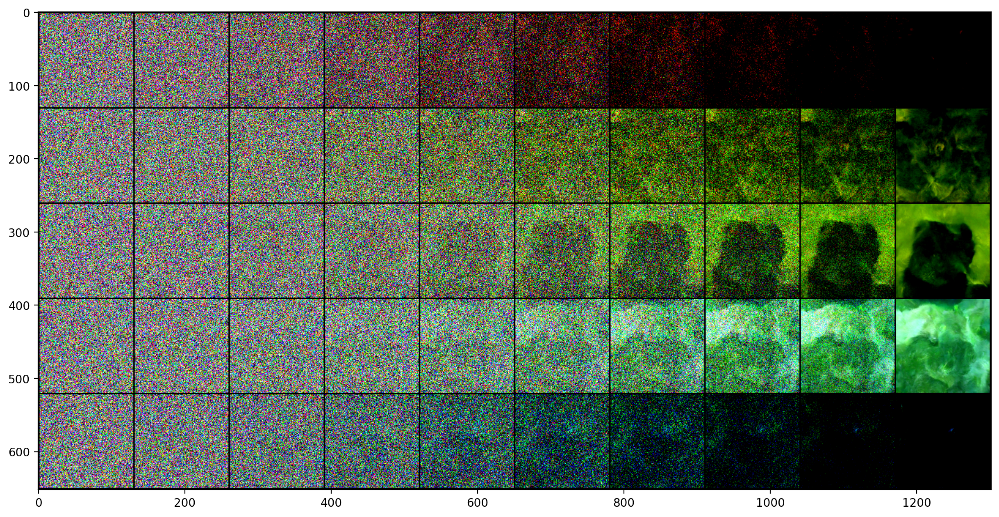

In [125]:
plt.figure(figsize=(15,15))
plt.imshow(grid.numpy().transpose(1,2,0))

In [31]:
torch.save(model.state_dict(), "saved_models/DDPM_epoch_5")

In [20]:
channel_mult = (1, 1, 2, 3, 4)
NUM_CLASSES = 3
attention_ds = []
num_channels = 128
num_res_blocks = 3
num_heads = 4
num_heads_upsample = -1
use_scale_shift_norm = True
use_checkpoint = False
dropout = 0.1
class_cond = False
attention_resolutions = [32,16,8]
for res in attention_resolutions:
    attention_ds.append(image_size // int(res))

model1 = UNetModel(
        in_channels=3,
        model_channels=num_channels,
        out_channels=3,
        num_res_blocks=num_res_blocks,
        attention_resolutions=tuple(attention_ds),
        dropout=dropout,
        channel_mult=channel_mult,
        num_classes=(NUM_CLASSES if class_cond else None),
        use_checkpoint=use_checkpoint,
        num_heads=num_heads,
        num_heads_upsample=num_heads_upsample,
        use_scale_shift_norm=use_scale_shift_norm,
    )

In [21]:
model1.load_state_dict(torch.load("saved_models_2/Unet_epoch_80"))
model1.to(device)
model1.eval()

UNetModel(
  (time_embed): Sequential(
    (0): Linear(in_features=128, out_features=512, bias=True)
    (1): SiLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
  )
  (input_blocks): ModuleList(
    (0): TimestepEmbedSequential(
      (0): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1): TimestepEmbedSequential(
      (0): ResBlock(
        (in_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): Identity()
          (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (h_upd): Identity()
        (x_upd): Identity()
        (emb_layers): Sequential(
          (0): SiLU()
          (1): Linear(in_features=512, out_features=256, bias=True)
        )
        (out_layers): Sequential(
          (0): GroupNorm32(32, 128, eps=1e-05, affine=True)
          (1): SiLU()
          (2): Dropout(p=0.1, inplace=False)
          (3): Conv2d(128, 128, kernel_size=(3, 3), 

In [28]:
for epoch in range(5,90,5):
    print(f"Epoch == {epoch}")
    model1.load_state_dict(torch.load(f"saved_models_2/Unet_epoch_{epoch}"))
    model1.to(device)
    model1.eval()
    all_samples = sample(model1, image_size = image_size, batch_size=4, channels=3)
    imgs = []
    for i, samples in tqdm(enumerate(all_samples), total=len(all_samples),
                                desc="saving image samples"):
        samples = samples.view(sample.shape[0], 3, 128, 128)

        samples = (samples + 1) * 0.5
        samples = samples.clip(0,1)
        

        image_grid = torchvision.utils.make_grid(samples, 2)

        if i % 50 == 0 or i==len(all_samples)-1:
            im = Image.fromarray(image_grid.mul_(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy())
            imgs.append(im)

        # torchvision.utils.save_image(image_grid, os.path.join('image_grids', 'image_grid_{}.png'.format(i)))
        #torch.save(sample, os.path.join(self.args.image_folder, 'samples_{}.pth'.format(i)))
    imgs[0].save(os.path.join('gifs', f"epoch_{epoch}.gif"), save_all=True, append_images=imgs[1:], duration=1, loop=0)
    torchvision.utils.save_image(image_grid, os.path.join('image_grids', 'epoch_{}.png'.format(epoch)))

Epoch == 5


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]

saving image samples:   0%|          | 0/4000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [31]:
samples = all_samples[-1].view(sample.shape[0], 3, 128, 128)
samples = (samples + 1) * 0.5
samples = samples.clip(0,1)
    

image_grid = torchvision.utils.make_grid(samples, 2)
torchvision.utils.save_image(image_grid, os.path.join('image_grids', 'epoch_{}.png'.format(epoch)))

In [21]:
for epoch in range(5,100,5):
    print(f"Epoch == {epoch}")
    model1.load_state_dict(torch.load(f"saved_models_2/Unet_epoch_{epoch}"))
    model1.to(device)
    model1.eval()
    all_samples = sample(model1, image_size = image_size, batch_size=100, channels=3)
    imgs = []
    for i, samples in tqdm(enumerate(all_samples), total=len(all_samples),
                                desc="saving image samples"):
        samples = samples.view(samples.shape[0], 3, 128, 128)

        samples = (samples + 1) * 0.5
        samples = samples.clip(0,1)
        

        image_grid = torchvision.utils.make_grid(samples, 10)

        if i % 100 == 0 or i==len(all_samples)-100:
            im = Image.fromarray(image_grid.mul_(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy())
            imgs.append(im)

        # torchvision.utils.save_image(image_grid, os.path.join('image_grids', 'image_grid_{}.png'.format(i)))
        #torch.save(sample, os.path.join(self.args.image_folder, 'samples_{}.pth'.format(i)))
    imgs[0].save(os.path.join('gifs', f"aepoch_{epoch}.gif"), save_all=True, append_images=imgs[1:], duration=1, loop=0)
    samples = all_samples[-1].view(samples.shape[0], 3, 128, 128)
    samples = (samples + 1) * 0.5
    samples = samples.clip(0,1)
        

    image_grid = torchvision.utils.make_grid(samples, 10)
    torchvision.utils.save_image(image_grid, os.path.join('image_grids', 'aepoch_{}.png'.format(epoch)))
    ds

Epoch == 5


sampling loop time step:   0%|          | 0/4000 [00:00<?, ?it/s]

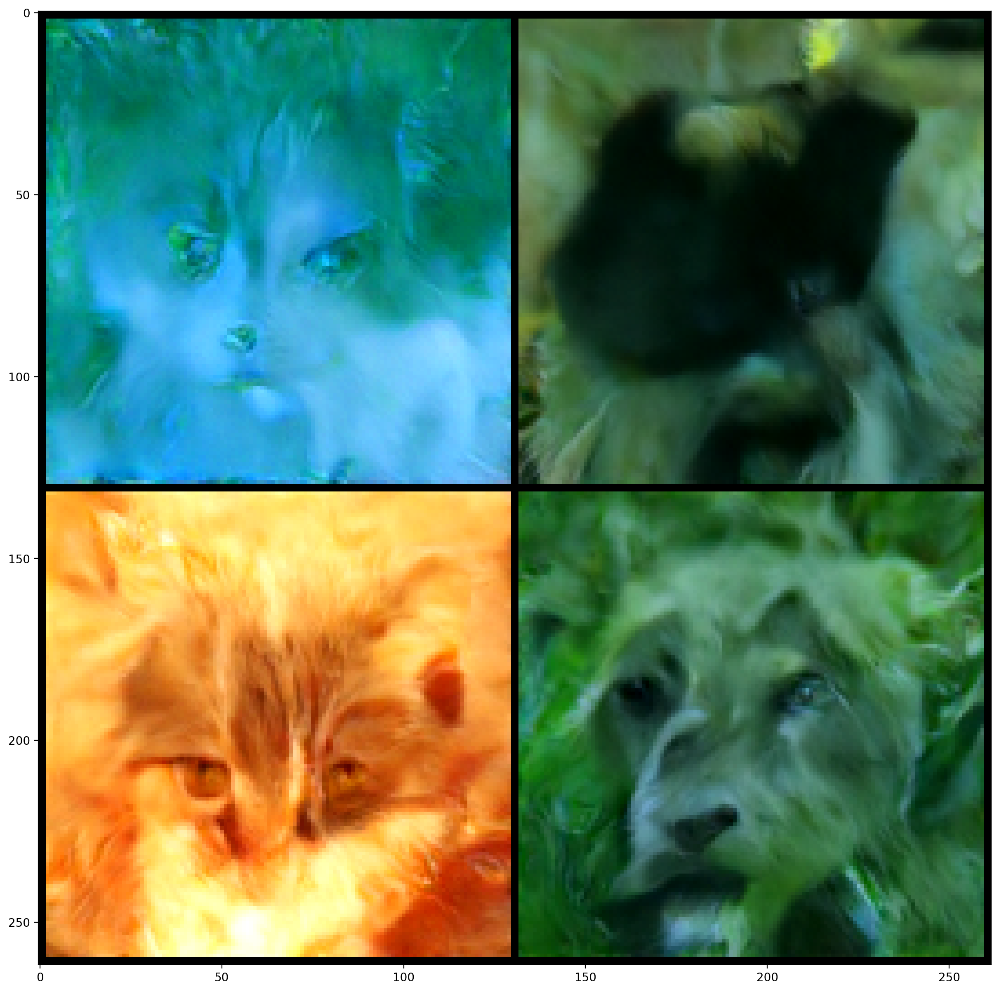

In [37]:
plt.figure(figsize=(15,15))
plt.imshow(image_grid.numpy().transpose(1,2,0))

In [38]:
len(imgs)

139

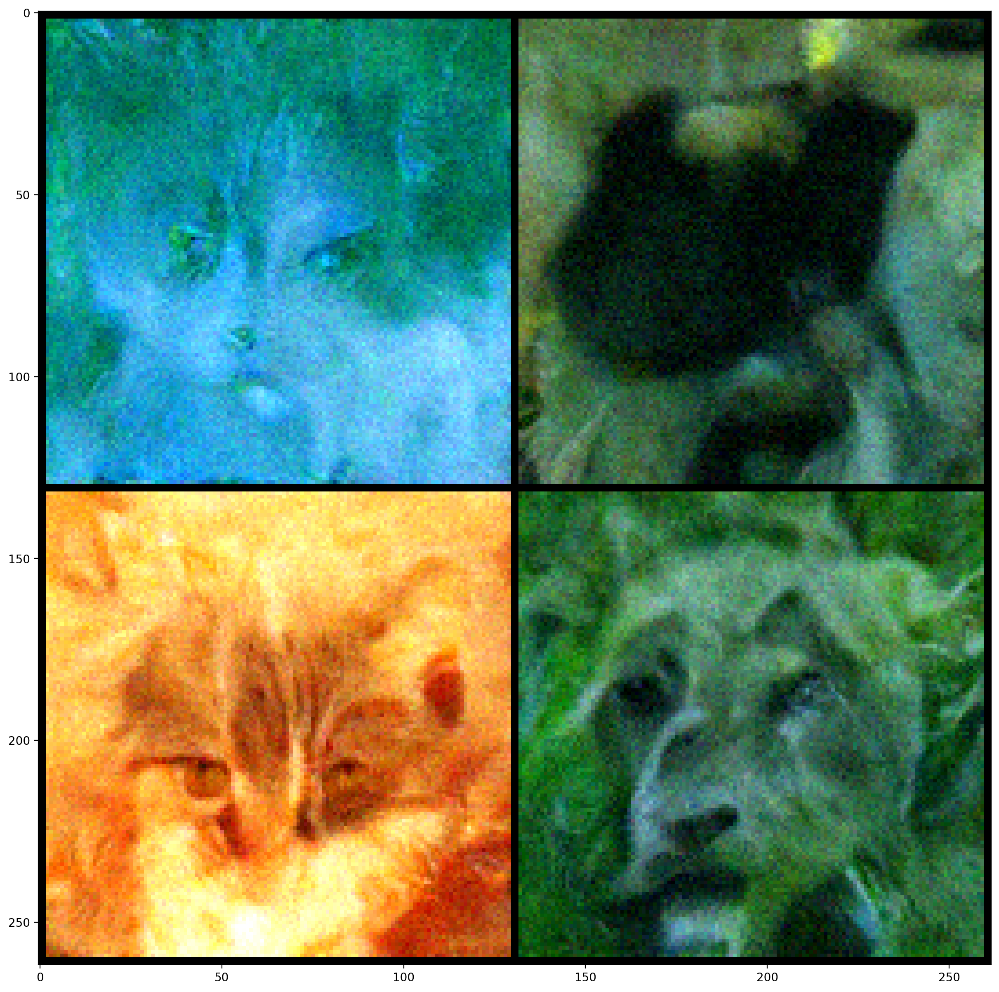

In [35]:
samples = all_samples[-100].view(sample.shape[0], 3, 128, 128)
samples = (samples + 1) * 0.5
samples = samples.clip(0,1)
    

image_grid = torchvision.utils.make_grid(samples, 2)
plt.figure(figsize=(15,15))
plt.imshow(image_grid.numpy().transpose(1,2,0))

In [25]:
len(all_samples)

4000